In [1]:
# initiation date: 2023-03-27

import warnings
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import seaborn as sns
from pytensor import tensor as pt 
import os 

print(f"Running on PyMC v{pm.__version__}")

from matplotlib import gridspec
from scipy import sparse, special, stats

%config InlineBackend.figure_format = 'retina'
warnings.simplefilter(action="ignore", category=FutureWarning)

# os.getcwd() 
os.chdir('/Users/abel/Desktop/Junior/CogMod/Assignments/H3') # change the working directory to the folder where the data is stored

# color pallette
[gr,ye,re,bl,pu,ir,ak] = ['#8ECFC9', '#FFBE7A', '#FA7F6F', '#82B0D2','#BEB8DC', '#E7DAD2','#999999']

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


Running on PyMC v5.1.2


In [3]:
az.style.use("arviz-white")

## 题目一

### Q1
请参考Assessment of malingering(Section 6.5 of Lee & Wagenmakers 2013)，使用贝叶斯方法对熟手和新手答对每道题目的概率$\psi_S$和$\psi_N$进行采样，分别画出它们采样的traceplot以及后验分布，并在分布中标注Highest Density Interval (HDI)。


----

首先，载入数据并且简单观察一下，大致可以感觉到前十位选手应该是熟手，后十位应该是新手。

但是在具体的实现中，可以将每个被试是新手还是熟手的概率定为一个随机变量。 $z(i)$

In [4]:
# load the data from the csv file and take a look
dt = pd.read_csv('homework3_q1.csv', header = 0 ) # load the data from the csv file

df_vis = dt
df_vis.style.bar(subset=['score'], color=pu, width=100)   # visualize the data with a bar plot indicating response

,id,score
0,1,29
1,2,31
2,3,30
3,4,32
4,5,30
5,6,28
6,7,29
7,8,27
8,9,32
9,10,33


整个答题过程可以用以下的随机过程描述：
- 每个被试 $z_i$ 有 $\alpha$ 的可能性是熟手，$\alpha$ 未知，但应该在 $(0,1)$ 之间；
- 如果是熟手，被试对所有题目的答题正确率均为 $\psi_S$；如果是新手，则正确率为 $\psi_N$;
- 由于是四选一题目，而两组被试都有认真答题，那么取值范围应该皆大于0.25，而老手答题正确率应该高于新手， $\psi_S > \psi_N$;
- 由于每个被试答题正确率确定为 $\theta_i$，n道题目的答对数目符合 $(\theta_i, n)$ 的二项分布。

随机变量可由以下表达式体现：

$$ \psi^S \sim \text{Uniform}(0.25,1) $$
$$ \psi^N \sim \text{Uniform}(0.25,\psi^S) $$
$$ \alpha \sim \text{Uniform}(0,1) $$
$$ z_{i} \sim \text{Bernoulli}(\alpha) $$
$$   \theta_{i} \sim
\begin{cases}
\psi^S  & \text{if $z_{i} = 1$} \\
\psi^N  & \text{if $z_{i} = 0$}
\end{cases}  $$
$$ k_{i} \sim \text{Binomial}(\theta_{i},n) $$ 

In [5]:
score = dt['score'].values # extract the score column
p = len(score)  # number of people
n = 50  # number of questions

In [6]:
def casechoice(case, choice1, choice2):
    if case == 1:
        return choice1
    else:
        return choice2

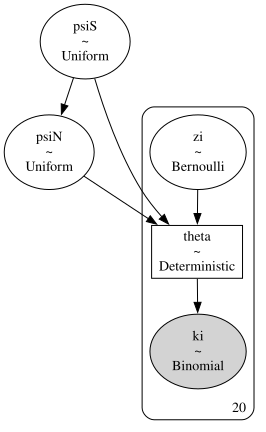

In [8]:
with pm.Model() as quizmodel:
    # prior
    psiS = pm.Uniform("psiS", lower=0.25, upper=1)
    psiN = pm.Uniform("psiN", lower=0.25, upper=psiS)

    # latent
    # alpha = pm.Uniform("alpha", lower=0, upper=1, shape=p)
    zi = pm.Bernoulli("zi", p=0.5, shape=p)
    theta = pm.Deterministic("theta", pt.switch(zi, psiS, psiN))

    # observed
    ki = pm.Binomial("ki", p=theta, n=n, observed=score)

pm.model_to_graphviz(quizmodel) # model graph

In [12]:
# Prior check

with quizmodel:
    prior_quizmodel = pm.sample_prior_predictive(samples=2000) # sample from the prior

display(prior_quizmodel)  

Sampling: [ki, psiN, psiS, zi]


Inference data with groups:
	> prior
	> prior_predictive
	> observed_data

/var/folders/xc/yqcd0q9s39x5rnx183pvw5qw0000gn/T/ipykernel_1288/1866780434.py:13: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


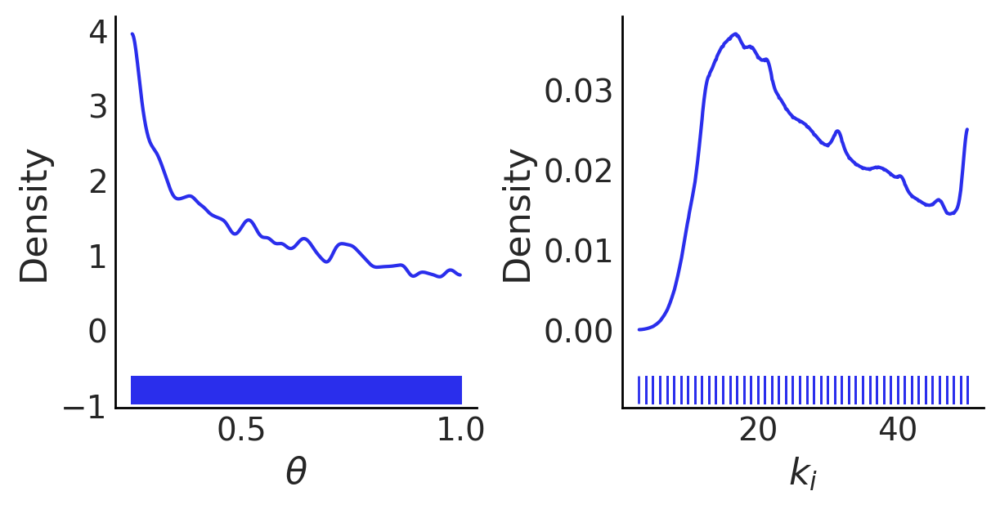

In [13]:
_, axes = plt.subplots(1, 2, figsize=(6, 3))
fs = 16

# plot prior
az.plot_dist(prior_quizmodel.prior["theta"].values.flatten(), ax=axes[0], kind="kde", rug=True)
axes[0].set_xlabel(r"$\theta$", fontsize=fs)
axes[0].set_ylabel("Density", fontsize=fs)

# plot prior predictive
az.plot_dist(prior_quizmodel.prior_predictive["ki"].values.flatten(), ax=axes[1], kind="kde", rug=True)
axes[1].set_xlabel(r"$k_i$", fontsize=fs)
axes[1].set_ylabel("Density", fontsize=fs)
plt.tight_layout();

In [14]:
with model1:
    trace1 = pm.sample()

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [psiS, psiN, alpha]
CompoundStep
>NUTS: [psiS, psiN, alpha]
>BinaryGibbsMetropolis: [zi]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 30 seconds.


In [16]:
display(trace1)

Inference data with groups:
	> posterior
	> sample_stats
	> observed_data

In [17]:
az.summary(trace1, var_names=["alpha", "psiS", "psiN"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[0],0.662,0.240,0.239,1.000,0.003,0.002,5490.0,2569.0,1.00
alpha[1],0.664,0.237,0.227,1.000,0.003,0.002,7576.0,2201.0,1.00
alpha[2],0.663,0.238,0.234,1.000,0.003,0.002,5415.0,2321.0,1.00
alpha[3],0.666,0.243,0.229,1.000,0.003,0.002,6598.0,2289.0,1.00
alpha[4],0.664,0.239,0.241,1.000,0.003,0.002,6540.0,2671.0,1.00
alpha[5],0.664,0.237,0.237,1.000,0.003,0.002,5756.0,2459.0,1.00
alpha[6],0.658,0.240,0.233,1.000,0.003,0.002,5780.0,2653.0,1.00
alpha[7],0.639,0.249,0.197,1.000,0.004,0.002,5152.0,2904.0,1.00
alpha[8],0.661,0.240,0.234,1.000,0.003,0.002,6919.0,2340.0,1.01
alpha[9],0.667,0.237,0.252,1.000,0.003,0.002,7206.0,2738.0,1.00


/var/folders/xc/yqcd0q9s39x5rnx183pvw5qw0000gn/T/ipykernel_1288/3300846951.py:3: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.5);


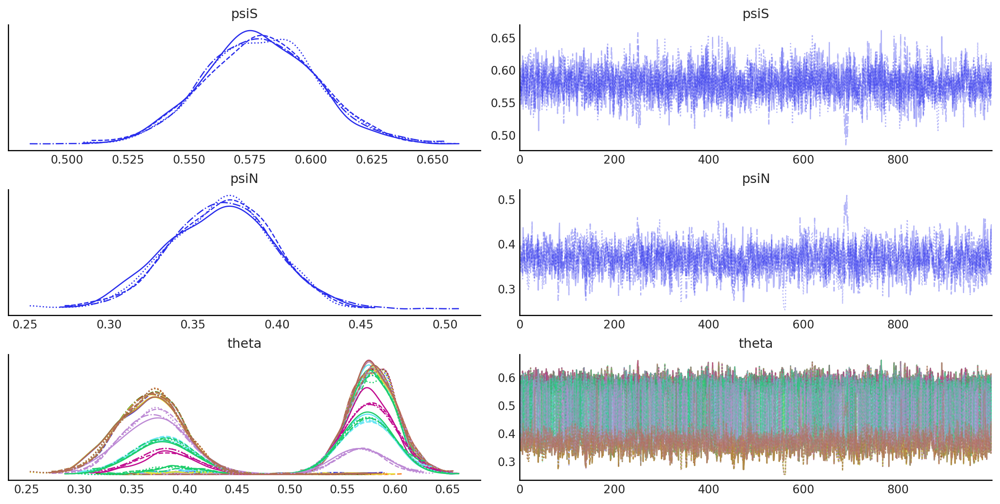

In [18]:
# Trace plot
az.plot_trace(trace1, var_names=["psiS", "psiN",'theta']);
plt.subplots_adjust(hspace=0.5);

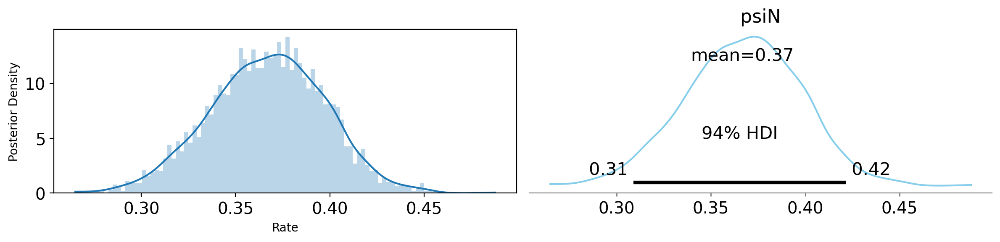

In [53]:

_, axes = plt.subplots(1, 2, figsize=(12, 3))

posterior_psiN = trace1.posterior["psiN"].values.flatten()    # read posterior samples and flatten
az.plot_kde(posterior_psiN, ax=axes[0])
axes[0].hist(posterior_psiN, bins=100, density=1, alpha=0.3)
axes[0].set_xlabel("Rate")
axes[0].set_ylabel("Posterior Density")

az.plot_posterior(trace1, var_names=["psiN"], ax=axes[1], color="#87ceeb")
plt.tight_layout();

### Q2
请以合理的方式画出$\psi_S$和$\psi_N$的联合后验分布。

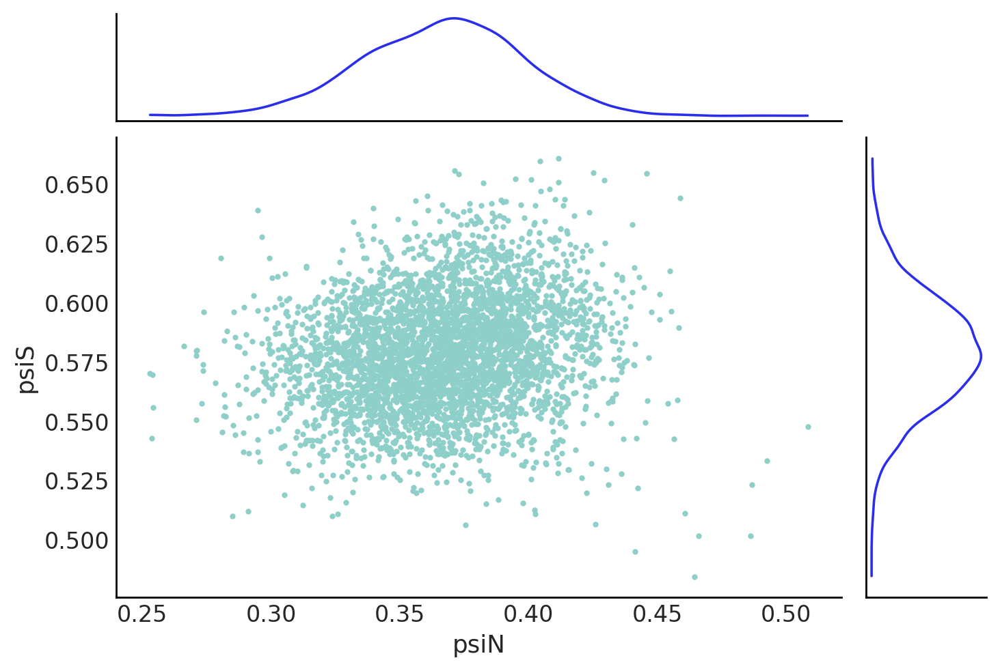

In [19]:
az.plot_pair(trace1, var_names=["psiN", "psiS"], kind='scatter', scatter_kwargs={'color':gr}, marginals=True, textsize=12);


### Q3
请画出每名被试是熟手的后验概率。

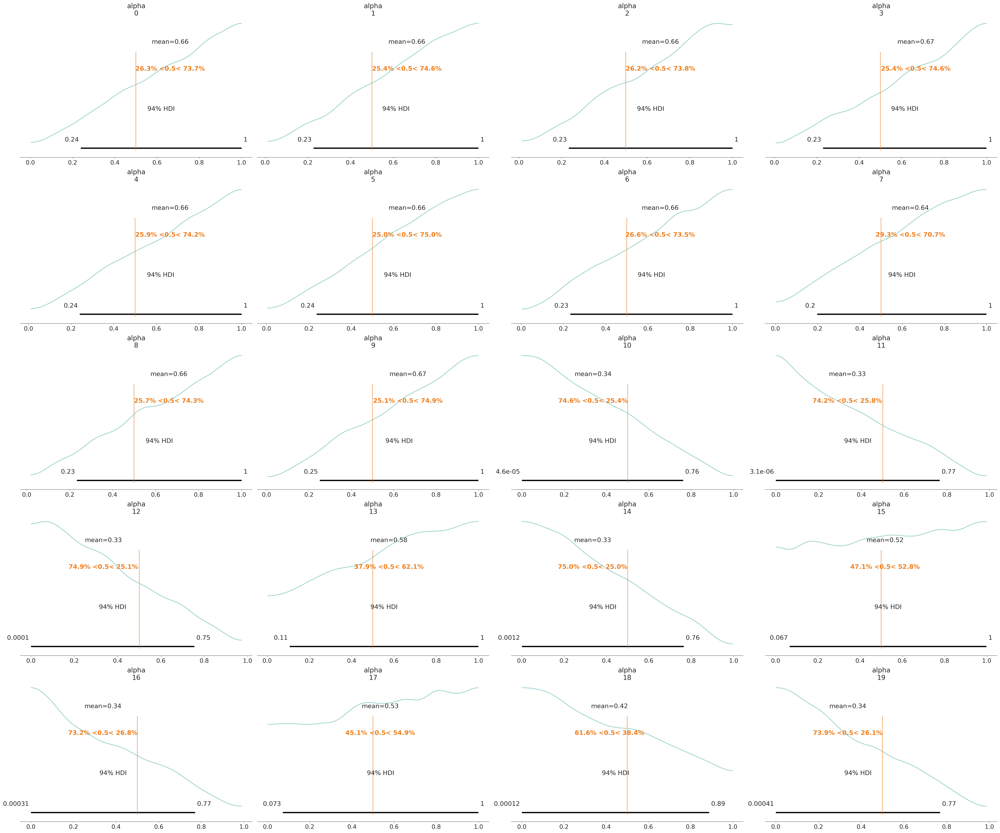

In [20]:
# posterior distribution of each alpha
az.plot_posterior(trace1, var_names=["alpha"], ref_val=0.5, color=gr);

/var/folders/xc/yqcd0q9s39x5rnx183pvw5qw0000gn/T/ipykernel_1288/3638711154.py:2: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.5);


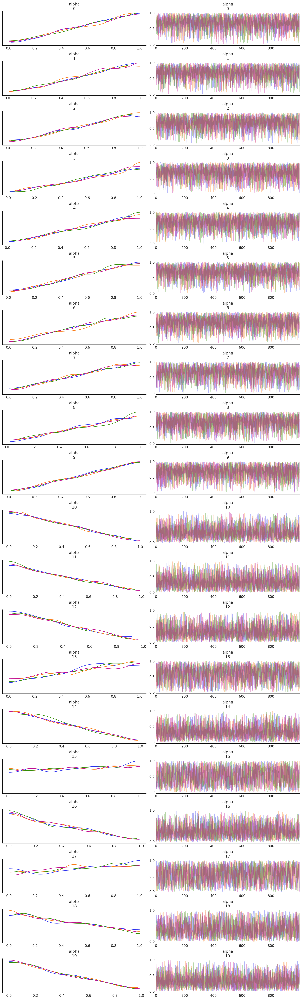

In [21]:
az.plot_trace(trace1, var_names=["alpha"], compact=False);
plt.subplots_adjust(hspace=0.5);